In [1]:
import ccxt
import numpy as np
import pandas as pd
import datetime as dt
from dateutil import tz
import matplotlib.pyplot as plt

import json
import time
import os
import sys

In [2]:
src_path = '../src/'
sys.path.append(os.path.abspath(src_path))
import func_get
import func_signal
import func_backtest

In [3]:
start_ts = time.time()

In [4]:
interval_dict = {
    '1m': 1,
    '5m': 5,
    '15m': 15,
    '30m': 30,
    '1h': 60,
    '2h': 120,
    '4h': 240,
    '1d': 1440
}

In [5]:
with open('../../../_keys/ftx/read.json') as keys_file:
    keys_dict = json.load(keys_file)
    
exchange = ccxt.ftx({'apiKey': keys_dict['apiKey'],
                     'secret': keys_dict['secret'],
                     'enableRateLimit': True})

### Config

In [6]:
project_name = 'cryptoris_30m'

In [7]:
start_date = dt.datetime(2022, 1, 1)
start_hour = 0
end_date = dt.datetime.today() - dt.timedelta(days=1)
reinvest_profit_flag = True

In [8]:
config_params = {
    'safety_ohlcv_range': 1000,
    'action_timeframe': '30m',
    'target_side': ['buy', 'sell'],
    'base': {
        'symbol': ['BTC-PERP', 'ETH-PERP', 'SOL-PERP'],
        'open': {
            '30m': {
                'ema': {
                    'check': ['check_signal_side'],
                    'look_back': 1,
                    'windows': 200,
                    'revert': False
                },
                'supertrend': {
                    'check': ['check_signal_side_change'],
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                },
                'wt': {
                    'check': ['check_signal_band'],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }
            },
            '1h': {
                'ema': {
                    'check': ['check_signal_side'],
                    'look_back': 1,
                    'windows': 200,
                    'revert': False
                },
                'supertrend': {
                    'check': ['check_signal_side'],
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                },
                'wt': {
                    'check': ['check_signal_band'],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }        
            }    
            
        },
        'close': {
            '30m': {
                'supertrend': {
                    'check': ['check_signal_side'],
                    'look_back': 0,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                },
                'wt': {
                    'check': ['check_signal_band'],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }    
            }
        }
    },
    'lead': {
        'symbol': ['BTC-PERP'],
        'open': {
            '30m': {
                'wt': {
                    'check': ['check_signal_band'],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }
            }
        },
        'close': {
        }
    },
    'tp': {
        'stop_percent': 50,
        'price_percent': 5,
        'signal': None,
    },
    'sl': {
        'stop_percent': 50,
        'price_percent': None,
        'signal': {
            'timeframe': '30m',
            'signal': {
                'supertrend': {
                    'look_back': 0,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                }
            }
        }
    },
    'action_percent': 10,
    'leverage': 10,
    'taker_fee_percent': 0.07
}

### Get data

In [9]:
ohlcv_df_dict = func_get.get_data(exchange, start_date, end_date, start_hour, interval_dict, config_params)

base: timeframe 1/2 symbol 1/3 date 1/217
base: timeframe 1/2 symbol 1/3 date 2/217
base: timeframe 1/2 symbol 1/3 date 3/217
base: timeframe 1/2 symbol 1/3 date 4/217
base: timeframe 1/2 symbol 1/3 date 5/217
base: timeframe 1/2 symbol 1/3 date 6/217
base: timeframe 1/2 symbol 1/3 date 7/217
base: timeframe 1/2 symbol 1/3 date 8/217
base: timeframe 1/2 symbol 1/3 date 9/217
base: timeframe 1/2 symbol 1/3 date 10/217
base: timeframe 1/2 symbol 1/3 date 11/217
base: timeframe 1/2 symbol 1/3 date 12/217
base: timeframe 1/2 symbol 1/3 date 13/217
base: timeframe 1/2 symbol 1/3 date 14/217
base: timeframe 1/2 symbol 1/3 date 15/217
base: timeframe 1/2 symbol 1/3 date 16/217
base: timeframe 1/2 symbol 1/3 date 17/217
base: timeframe 1/2 symbol 1/3 date 18/217
base: timeframe 1/2 symbol 1/3 date 19/217
base: timeframe 1/2 symbol 1/3 date 20/217
base: timeframe 1/2 symbol 1/3 date 21/217
base: timeframe 1/2 symbol 1/3 date 22/217
base: timeframe 1/2 symbol 1/3 date 23/217
base: timeframe 1/2 

base: timeframe 1/2 symbol 1/3 date 190/217
base: timeframe 1/2 symbol 1/3 date 191/217
base: timeframe 1/2 symbol 1/3 date 192/217
base: timeframe 1/2 symbol 1/3 date 193/217
base: timeframe 1/2 symbol 1/3 date 194/217
base: timeframe 1/2 symbol 1/3 date 195/217
base: timeframe 1/2 symbol 1/3 date 196/217
base: timeframe 1/2 symbol 1/3 date 197/217
base: timeframe 1/2 symbol 1/3 date 198/217
base: timeframe 1/2 symbol 1/3 date 199/217
base: timeframe 1/2 symbol 1/3 date 200/217
base: timeframe 1/2 symbol 1/3 date 201/217
base: timeframe 1/2 symbol 1/3 date 202/217
base: timeframe 1/2 symbol 1/3 date 203/217
base: timeframe 1/2 symbol 1/3 date 204/217
base: timeframe 1/2 symbol 1/3 date 205/217
base: timeframe 1/2 symbol 1/3 date 206/217
base: timeframe 1/2 symbol 1/3 date 207/217
base: timeframe 1/2 symbol 1/3 date 208/217
base: timeframe 1/2 symbol 1/3 date 209/217
base: timeframe 1/2 symbol 1/3 date 210/217
base: timeframe 1/2 symbol 1/3 date 211/217
base: timeframe 1/2 symbol 1/3 d

base: timeframe 1/2 symbol 2/3 date 163/217
base: timeframe 1/2 symbol 2/3 date 164/217
base: timeframe 1/2 symbol 2/3 date 165/217
base: timeframe 1/2 symbol 2/3 date 166/217
base: timeframe 1/2 symbol 2/3 date 167/217
base: timeframe 1/2 symbol 2/3 date 168/217
base: timeframe 1/2 symbol 2/3 date 169/217
base: timeframe 1/2 symbol 2/3 date 170/217
base: timeframe 1/2 symbol 2/3 date 171/217
base: timeframe 1/2 symbol 2/3 date 172/217
base: timeframe 1/2 symbol 2/3 date 173/217
base: timeframe 1/2 symbol 2/3 date 174/217
base: timeframe 1/2 symbol 2/3 date 175/217
base: timeframe 1/2 symbol 2/3 date 176/217
base: timeframe 1/2 symbol 2/3 date 177/217
base: timeframe 1/2 symbol 2/3 date 178/217
base: timeframe 1/2 symbol 2/3 date 179/217
base: timeframe 1/2 symbol 2/3 date 180/217
base: timeframe 1/2 symbol 2/3 date 181/217
base: timeframe 1/2 symbol 2/3 date 182/217
base: timeframe 1/2 symbol 2/3 date 183/217
base: timeframe 1/2 symbol 2/3 date 184/217
base: timeframe 1/2 symbol 2/3 d

base: timeframe 1/2 symbol 3/3 date 136/217
base: timeframe 1/2 symbol 3/3 date 137/217
base: timeframe 1/2 symbol 3/3 date 138/217
base: timeframe 1/2 symbol 3/3 date 139/217
base: timeframe 1/2 symbol 3/3 date 140/217
base: timeframe 1/2 symbol 3/3 date 141/217
base: timeframe 1/2 symbol 3/3 date 142/217
base: timeframe 1/2 symbol 3/3 date 143/217
base: timeframe 1/2 symbol 3/3 date 144/217
base: timeframe 1/2 symbol 3/3 date 145/217
base: timeframe 1/2 symbol 3/3 date 146/217
base: timeframe 1/2 symbol 3/3 date 147/217
base: timeframe 1/2 symbol 3/3 date 148/217
base: timeframe 1/2 symbol 3/3 date 149/217
base: timeframe 1/2 symbol 3/3 date 150/217
base: timeframe 1/2 symbol 3/3 date 151/217
base: timeframe 1/2 symbol 3/3 date 152/217
base: timeframe 1/2 symbol 3/3 date 153/217
base: timeframe 1/2 symbol 3/3 date 154/217
base: timeframe 1/2 symbol 3/3 date 155/217
base: timeframe 1/2 symbol 3/3 date 156/217
base: timeframe 1/2 symbol 3/3 date 157/217
base: timeframe 1/2 symbol 3/3 d

base: timeframe 2/2 symbol 1/3 date 108/217
base: timeframe 2/2 symbol 1/3 date 109/217
base: timeframe 2/2 symbol 1/3 date 110/217
base: timeframe 2/2 symbol 1/3 date 111/217
base: timeframe 2/2 symbol 1/3 date 112/217
base: timeframe 2/2 symbol 1/3 date 113/217
base: timeframe 2/2 symbol 1/3 date 114/217
base: timeframe 2/2 symbol 1/3 date 115/217
base: timeframe 2/2 symbol 1/3 date 116/217
base: timeframe 2/2 symbol 1/3 date 117/217
base: timeframe 2/2 symbol 1/3 date 118/217
base: timeframe 2/2 symbol 1/3 date 119/217
base: timeframe 2/2 symbol 1/3 date 120/217
base: timeframe 2/2 symbol 1/3 date 121/217
base: timeframe 2/2 symbol 1/3 date 122/217
base: timeframe 2/2 symbol 1/3 date 123/217
base: timeframe 2/2 symbol 1/3 date 124/217
base: timeframe 2/2 symbol 1/3 date 125/217
base: timeframe 2/2 symbol 1/3 date 126/217
base: timeframe 2/2 symbol 1/3 date 127/217
base: timeframe 2/2 symbol 1/3 date 128/217
base: timeframe 2/2 symbol 1/3 date 129/217
base: timeframe 2/2 symbol 1/3 d

base: timeframe 2/2 symbol 2/3 date 81/217
base: timeframe 2/2 symbol 2/3 date 82/217
base: timeframe 2/2 symbol 2/3 date 83/217
base: timeframe 2/2 symbol 2/3 date 84/217
base: timeframe 2/2 symbol 2/3 date 85/217
base: timeframe 2/2 symbol 2/3 date 86/217
base: timeframe 2/2 symbol 2/3 date 87/217
base: timeframe 2/2 symbol 2/3 date 88/217
base: timeframe 2/2 symbol 2/3 date 89/217
base: timeframe 2/2 symbol 2/3 date 90/217
base: timeframe 2/2 symbol 2/3 date 91/217
base: timeframe 2/2 symbol 2/3 date 92/217
base: timeframe 2/2 symbol 2/3 date 93/217
base: timeframe 2/2 symbol 2/3 date 94/217
base: timeframe 2/2 symbol 2/3 date 95/217
base: timeframe 2/2 symbol 2/3 date 96/217
base: timeframe 2/2 symbol 2/3 date 97/217
base: timeframe 2/2 symbol 2/3 date 98/217
base: timeframe 2/2 symbol 2/3 date 99/217
base: timeframe 2/2 symbol 2/3 date 100/217
base: timeframe 2/2 symbol 2/3 date 101/217
base: timeframe 2/2 symbol 2/3 date 102/217
base: timeframe 2/2 symbol 2/3 date 103/217
base: t

base: timeframe 2/2 symbol 3/3 date 52/217
base: timeframe 2/2 symbol 3/3 date 53/217
base: timeframe 2/2 symbol 3/3 date 54/217
base: timeframe 2/2 symbol 3/3 date 55/217
base: timeframe 2/2 symbol 3/3 date 56/217
base: timeframe 2/2 symbol 3/3 date 57/217
base: timeframe 2/2 symbol 3/3 date 58/217
base: timeframe 2/2 symbol 3/3 date 59/217
base: timeframe 2/2 symbol 3/3 date 60/217
base: timeframe 2/2 symbol 3/3 date 61/217
base: timeframe 2/2 symbol 3/3 date 62/217
base: timeframe 2/2 symbol 3/3 date 63/217
base: timeframe 2/2 symbol 3/3 date 64/217
base: timeframe 2/2 symbol 3/3 date 65/217
base: timeframe 2/2 symbol 3/3 date 66/217
base: timeframe 2/2 symbol 3/3 date 67/217
base: timeframe 2/2 symbol 3/3 date 68/217
base: timeframe 2/2 symbol 3/3 date 69/217
base: timeframe 2/2 symbol 3/3 date 70/217
base: timeframe 2/2 symbol 3/3 date 71/217
base: timeframe 2/2 symbol 3/3 date 72/217
base: timeframe 2/2 symbol 3/3 date 73/217
base: timeframe 2/2 symbol 3/3 date 74/217
base: timef

lead: timeframe 1/1 symbol 1/1 date 23/217
lead: timeframe 1/1 symbol 1/1 date 24/217
lead: timeframe 1/1 symbol 1/1 date 25/217
lead: timeframe 1/1 symbol 1/1 date 26/217
lead: timeframe 1/1 symbol 1/1 date 27/217
lead: timeframe 1/1 symbol 1/1 date 28/217
lead: timeframe 1/1 symbol 1/1 date 29/217
lead: timeframe 1/1 symbol 1/1 date 30/217
lead: timeframe 1/1 symbol 1/1 date 31/217
lead: timeframe 1/1 symbol 1/1 date 32/217
lead: timeframe 1/1 symbol 1/1 date 33/217
lead: timeframe 1/1 symbol 1/1 date 34/217
lead: timeframe 1/1 symbol 1/1 date 35/217
lead: timeframe 1/1 symbol 1/1 date 36/217
lead: timeframe 1/1 symbol 1/1 date 37/217
lead: timeframe 1/1 symbol 1/1 date 38/217
lead: timeframe 1/1 symbol 1/1 date 39/217
lead: timeframe 1/1 symbol 1/1 date 40/217
lead: timeframe 1/1 symbol 1/1 date 41/217
lead: timeframe 1/1 symbol 1/1 date 42/217
lead: timeframe 1/1 symbol 1/1 date 43/217
lead: timeframe 1/1 symbol 1/1 date 44/217
lead: timeframe 1/1 symbol 1/1 date 45/217
lead: timef

lead: timeframe 1/1 symbol 1/1 date 212/217
lead: timeframe 1/1 symbol 1/1 date 213/217
lead: timeframe 1/1 symbol 1/1 date 214/217
lead: timeframe 1/1 symbol 1/1 date 215/217
lead: timeframe 1/1 symbol 1/1 date 216/217
lead: timeframe 1/1 symbol 1/1 date 217/217


### Add signal

In [10]:
ohlcv_df_dict = func_signal.add_signal(start_date, ohlcv_df_dict, interval_dict, config_params)

base add ema to BTC-PERP 1h
base add supertrend to BTC-PERP 1h
base add wt to BTC-PERP 1h
base add ema to ETH-PERP 1h
base add supertrend to ETH-PERP 1h
base add wt to ETH-PERP 1h
base add ema to SOL-PERP 1h
base add supertrend to SOL-PERP 1h
base add wt to SOL-PERP 1h
base add ema to BTC-PERP 30m
base add supertrend to BTC-PERP 30m
base add wt to BTC-PERP 30m
base add ema to ETH-PERP 30m
base add supertrend to ETH-PERP 30m
base add wt to ETH-PERP 30m
base add ema to SOL-PERP 30m
base add supertrend to SOL-PERP 30m
base add wt to SOL-PERP 30m
lead add wt to BTC-PERP 30m


### Back test

In [11]:
action_time_list = func_get.gen_action_time_list(config_params, ohlcv_df_dict)
max_open_timeframe = func_backtest.get_max_open_timeframe(config_params, interval_dict)

In [12]:
budget = 100

transaction_dict = {
    'symbol': [],
    'side': [],
    'amount': [],
    'open_time': [],
    'open_price': [],
    'close_time': [],
    'close_price': [],
    'value': [],
    'notional': [],
    'profit': [],
    'profit_percent': []
}

position_dict = {}

if reinvest_profit_flag == True:
    budget_dict = {
        'time': [],
        'budget': []
    }
    
max_drawdown = 0

In [13]:
if reinvest_profit_flag == True:
    min_budget = budget

time_count = 0

for signal_time in action_time_list:
    action_time = signal_time + dt.timedelta(minutes=interval_dict[config_params['action_timeframe']])
    
    time_count += 1
    print(f"Time {action_time}: progress {time_count}/{len(action_time_list)}")

    '''
    Close positions
    '''
    for symbol in [x for x in position_dict.keys()]:
        print(f"  {symbol}")
        budget, max_drawdown, position_dict, transaction_dict = func_backtest.close_position(symbol, signal_time, max_drawdown, config_params, budget, reinvest_profit_flag, ohlcv_df_dict, position_dict, transaction_dict, interval_dict)

    '''
    Open positions
    '''
    max_position = int(1 / (config_params['action_percent'] / 100))

    for symbol in [x for x in config_params['base']['symbol'] if x not in position_dict.keys()][:max_position]:
        print(f"  {symbol}")
        position_dict = func_backtest.open_position(symbol, signal_time, max_open_timeframe, config_params, budget, ohlcv_df_dict, position_dict, interval_dict)    
    
    '''
    Update budget
    '''
    if reinvest_profit_flag == True:
        budget_dict['time'].append(signal_time)
        budget_dict['budget'].append(budget)

        if budget < min_budget:
            min_budget = budget

    if budget <= 0:
        print(f"Out of money at {action_time}")
        break
        
'''
Clear final position
'''
opened_symbol = list(position_dict.keys())

for symbol in opened_symbol:
    print(f" Clear {symbol} position")
    
    side = position_dict[symbol]['side']
    ohlcv_df = ohlcv_df_dict['base'][config_params['action_timeframe']][symbol]
    current_ohlcv_df = ohlcv_df[ohlcv_df['time'] == signal_time].reset_index(drop=True)
    close_price = current_ohlcv_df.loc[0, 'close']
    close_percent = 100
    
    budget, position_dict, transaction_dict = func_backtest.update_close_position(symbol, side, close_price, close_percent, signal_time, config_params, budget, reinvest_profit_flag, position_dict, transaction_dict, interval_dict)

Time 2022-01-01 00:30:00: progress 1/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: sell
     base SOL-PERP check_signal_band wt 3

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-01 13:30:00: progress 27/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-

     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-02 02:00:00: progress 52/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_a

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-02 14:00:00: progress 76/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP 

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-03 02:30:00: progress 101/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP 

     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-03 16:00:00: progress 128/8400
  BTC-PERP
     base BTC-PERP ch

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-04 04:00:00: progress 152/8400
  ETH-PERP
       side: sell
       price: 3680.5
       sl: 3793.8110500787725
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: buy
     Closed by signal at 3699.2
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-04 17:00:00: progress 178/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_b

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-05 06:30:00: progress 205/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP che

     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL

     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-06 07:00:00: progress 254/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP chec

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-06 20:00:00: progress 280/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PER

     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-07 08:00:00: progress 304/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP 

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-07 19:30:00: progress 327/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_b

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-08 08:30:00: progress 353/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC

     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-08 21:00:00: progress 378/8400
  BTC-PERP
     base BTC-PERP

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-09 10:00:00: progress 404/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-P

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-09 22:00:00: progress 428/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_ba

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-10 10:30:00: progress 453/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 

     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-10 23

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-11 11:30:00: progress 503/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band w

     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: buy
     base BTC-PERP check_signal_band wt 30m: buy
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: buy
     base SOL-PERP check_signal_band wt 30m: buy
     base SOL-PERP check_signal_side ema

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-12 12:00:00: progress 552/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP chec

     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-13 01:00:00: progress 578/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_s

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-13 13:00:00: progress 602/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: b

     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-14 14:30:00: progress 653/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PE

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-15 02:00:00: progress 676/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band w

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-15 14:00:00: progress 700/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP che

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-16 02:30:00: progress 725/8400
  ETH-PERP
       side: buy
       price: 3339.3
       sl: 3301.9224322386494
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: buy
     base ETH-PERP check_signal_band wt 30m: buy
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_sign

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-16 16:00:00: 

     base BTC-PERP check_signal_band wt 30m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-17 07:00:00: progress 782/8400
  ETH-PERP
       side: buy
       price: 3347.1
       sl: 3302.1652517218686
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: buy
     base ETH-PERP check_signal_band wt 30m: buy
     Not close
  BTC-PERP
       side: buy
       price: 43074.0
       sl: 42739.16787811548
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: buy
     base BTC-PERP check_signal_band wt 30m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_si

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-17 19:00:00: progress 806/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC

     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SO

     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  SOL-PERP
       side: sell
       price: 137.0725
       sl: 140.63079980986734
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-18 19:30:00: progress 855/8400
  ETH-PERP
       side: sell
       price: 3148.3
       sl: 3214.076997060808
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  SOL-PERP
       side: sell
     

     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-19 06:30:00: progress 877/8400
  BTC-PERP
     base BTC-PERP

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-19 20:00:00: progress 904/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-P

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_sig

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-20 19:

     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-21 08:00:00: progress 976/8400
  ETH-PERP
       side: sell
       price: 3012.2
       sl: 3120.1355495177304
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_cha

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP che

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-22 06:30:00: progress 1021/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PE

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-22 18:00:00: progress 1044/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PER

     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     bas

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP che

     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-24 07:30:00: progress 1119/8400
  SOL-PERP
       side: sell
       price: 92.3
       sl: 101.04003509543

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-24 19:30:00: progress 1143/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_sign

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-25 17:30:00: progress 1187/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP 

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-26 04:30:00: progress 1209/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP c

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_si

     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-27 03:30:00: progress 1255/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: sell
     base ETH-PERP check_signal_band wt

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-27 15:00:00: progress 1278/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-

     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     sell: 0.04831032756055071
     price: 2395.1
     tp: 2275.345
     sl: 2504.534312958929
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_

     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-29 04:30:00: progress 1353/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 3

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-01-29 15:30:00: progress 1375/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP ch

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP 

     base BTC-PERP check_signal_band wt 30m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-30 16:00:00: progress 1424/8400
  BTC-PERP
       side: buy
       price: 37990.0
       sl: 37742.14086789083
     

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signa

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-01-31 15:30:00: progress 1471/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-01 03:30:00: progress 1495/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP ch

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-01 14:00:00: progress 1516/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-02 01:30:00: progress 1539/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP che

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-02 12:00:00: progress 1560/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertre

     base BTC-PERP check_signal_band wt 30m: sell
     Not close
     Update sl: 38298.6917606263
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-02 23:30:00: progress 1583/8400
  BTC-PERP
       side: sell
       price: 3706

     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-03 11:30:00: progress 1607/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_sid

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-03 22:00:00: progress 1628/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-04 09:30:00: progress 1651/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-P

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-04 20:00:00: progress 1672/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP che

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-05 08:00:00: progress 1696/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-05 18:30:00: progress 1717/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-06 06:00:00: progress 1740/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-06 16:30:00: 

     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 3

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PER

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-08 01:30:00: progress 1827/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP 

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-08 13:00:00: progress 1850/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-08 23:30:00: progress 1871/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PE

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-09 11:00:00: progress 1894/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PER

     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-09 21:30:00: progress 1915/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side super

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP 

     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-10 19:00:00: progress 1958/8400
  ETH-PERP
       side: buy
       price: 3241.2
       sl: 3185.6982856867776
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: buy
     base ETH-PERP check_signal_band wt 30m: buy
     Not close
     Update sl: 3189.81011140629
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_act

     base ETH-PERP check_signal_band wt 30m: sell
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-11 07:00:00: progress 1982/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side super

     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base S

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-12 04:30:00: progress 2025/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-12 15:00:00: progress 2046/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PER

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-13 02:00:00: progress 2068/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_b

     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
       side: sell
       price: 2905.5
       sl: 2973.41604029318
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-13 14:30:00: progress 2093/8400
  BTC-PERP
       side: sell
       price: 42368.0
       sl: 42773.746470626196
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
       side: sell
    

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-14 03:30:00: progress 2119/8400
  BTC-PERP
       side: sell
       price: 41971.0
       sl: 42668.526853177966
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
       side: sell
       price: 2849.1
       sl: 2923.4835017891246
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
 

     base ETH-PERP check_signal_band wt 30m: sell
     Not close
     Update sl: 2918.244727009221
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-14 18:00:00: progress 2148/8400
  BTC-PERP
       side: sell
       price: 42140.0
       sl: 42474.97911081016
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
       side: sell
       price: 2858.8
       sl: 2918.244727009221
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-15 05:00:00: progress 2170/8400
  ETH-PERP
       side: sell
       price: 2889.6
       sl: 2957.746078751039
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-15 15:30:00: progress 2191/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP 

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-16 02:30:00: progress 2213/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: 

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP c

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-16 23:30:00: progress 2255/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP 

       side: sell
       price: 98.78
       sl: 101.75247767781036
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: 

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-18 09:00:00: progress 2322/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PER

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-19 07:00:00: progress 2366/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-19 17:00:00: progress 2386/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-20 03:30:00: progress 2407/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-20 13:30:00: progress 2427/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band w

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-21 01:00:00: progress 2450/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side su

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PE

     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-21 22:30:00: progress 2493/8400
  SOL-PERP
       side: sell
       price: 90.31
       sl: 91.99484579619897
       sl_flag: True
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-22 11:00:00: progress 2518/8400
  ETH-PERP
       side: sell
       price: 2508.1
       sl: 2683.8114986016753
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: buy
     Closed by signal at 2520.3
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     b

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-22 21:00:00: progress 2538/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-23 07:00:00: progress 2558/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-

     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-24 04:00:00: progress 2600/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PE

     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SO

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-25 01:00:00: progress 2642/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-25 12:00:00: progress 2664/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP che

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-25 21:30:00: progress 2683/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP chec

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-26 08:00:00: progress 2704/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supert

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-26 19:00:00: progress 2726/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-02-27 05:30:00: 

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-27 16:30:00: progress 2769/8400
  BTC-PERP
       side: sell
       price: 38766.0
       sl: 39248.31191641265
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-28 03:00:00: progress 2790/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-28 13:30:00: progress 2811/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_si

     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-02-28 23:30:00: progress 2831/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supert

     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-01 10:00:00: progress 2852/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side super

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-01 20:00:00: progress 2872/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP chec

     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-02 06:30:00: progress 2893/8400
  BTC-PERP
     base BTC-PERP check_s

     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-02 17:30:00: progress 2915/8400
  ETH-PERP
       side: buy
       price: 2987.8
       sl: 2923.25539558828
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: buy
     base ETH-PERP check_signal_band wt 30m: buy
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertre

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-03 05:00:00: progress 2938/8400
  BTC-PERP
       side: buy
       price: 43793.0
       sl: 43310.17478391292
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: buy
     base BTC-PERP check_signal_band wt 30m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertre

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-03 16:30:00: progress 2961/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-04 02:30:00: progress 2981/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP

Time 2022-03-04 12:30:00: progress 3001/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SO

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-04 23:00:00: progress 3022/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-P

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-05 09:00:00: progress 3042/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP

     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-

     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-06 05:30:00: progress 3083/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP

  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-06 16:30:00: progress 3105/8400
  BTC-PERP
       side: sell
       price: 38689.0
       sl: 39652.77702836445
       sl_flag: False
     base BTC-PERP check_signal_side 

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base

     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-07 14:00:00: progress 3148/8400
  BTC-PERP
       side: sell
       price: 38063.0
       sl: 38837.47929407733
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side em

     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base 

     base ETH-PERP check_signal_band wt 30m: buy
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-08 16:00:00: progress 3200/8400
  SOL-PERP
       side: sell
       price: 83.8
       sl: 84.57009295527263
       sl_flag: True
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m:

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-09 03:00:00: progress 3222/8400
  SOL-PERP
       side: sell
       price: 82.175
       sl: 84.57009295527263
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side em

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-09 13:30:00: progress 3243/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-09 23:00:00: progress 3262/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP c

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-10 09:30:00: progress 3283/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP ch

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-10 19:00:00: progress 3302/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_ba

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-11 05:00:00: progress 3322/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-11 14:30:00: progress 3341/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: buy
     base ETH-PERP check_signal_band wt 30m: buy
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check

     Update sl: 83.40713184733657
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-12 01:00:00: progress 3362/8400
  BTC-PERP
       side: sell
       price: 38613.0
       sl: 39829.826723242935
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  SOL-PERP
       side: sell
       price: 80.5925
       sl: 83.40713184733657
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
     Update sl: 83.25991866260291
  ETH-PERP
     base ETH-PER

  SOL-PERP
       side: sell
       price: 81.88
       sl: 82.65043979022235
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-12 14:00:00: progress 3388/8400
  BTC-PERP
       side: sell
       price: 39067.0
       sl: 39482.71302581426
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  SOL-PERP
       side: sell
       price: 81.5625
       sl: 82.65043979022235
       sl_flag: Fal

  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-13 04:30:00: progress 3417/8400
  BTC-PERP
       side: sell
       price: 39097.0
       sl: 39400.52772262374
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  SOL-PERP
       side: sell
       price: 81.8625
       sl: 82.65043979022235
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_sid

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-13 16:30:00: progress 3441/8400
  BTC-PERP
       side: sell
       price: 39032.0
       sl: 39337.790751075154
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 

     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-14 03:30:00: progress 3463/8400
  SOL-PERP
       side: sell
       price: 78.4
       sl: 81.64256886811418
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
     Update sl: 81.23675991190134
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
    

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-14 13:00:00: progress 3482/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-14 23:00:00: progress 3502/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side sup

     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band

     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base S

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-16 04:30:00: progress 3561/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP ch

     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-16 14:30:00: progress 3581/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_sig

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-17 00:30:00: progress 3601/8400
  BTC-PERP
       side: buy
       price: 40100.0
       sl: 39619.92634198417
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: buy
     base BTC-PERP check_signal_band wt 30m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_sign

  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-17 12:00:00: progress 3624/8400
  BTC-PERP
       side: buy
       price: 40992.0
       sl: 40136.0538592306
       sl_flag: False
     base BTC-PERP check_signal_side supertre

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-17 23:30:00: progress 3647/8400
  BTC-PERP
       side: buy
       price: 40637.0
       sl: 40318.698318089955
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: buy
     base BTC-PERP check_signal_band wt 30m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_si

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-18 09:30:00: progress 3667/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-18 19:30:00: progress 3687/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check

     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-19 06:00:00: progress 3708/8400
  SOL-PERP
       side: buy
       price: 88.9125
       sl: 88.23669191724605
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: buy
     base SOL-PERP check_signal_band wt 30m: buy
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m:

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-19 17:30:00: progress 3731/8400
  SOL-PERP
       side: buy
       price: 89.78
       sl: 88.85877821122332
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: buy
     base SOL-PERP check_signal_band wt 30m: buy
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-20 03:30:00: progress 3751/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-20 13:30:00: 

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-20 23:00:00: progress 3790/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP ch

     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SO

     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-21 18:30:00: progress 3829/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP chec

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-22 04:00:00: progress 3848/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-22 23:30:00: progress 3887/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP che

     base ETH-PERP check_signal_band wt 30m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-23 09:00:00: progress 3906/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h:

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-23 18:30:00: progress 3925/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_s

     base BTC-PERP check_signal_band wt 30m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-24 05:30:00: progress 3947/8400
  BTC-PERP
       side: buy
       price: 42343.0
       sl: 41865.53634723672
      

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-24 14:30:00: progress 3965/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP ch

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-25 00:30:00: progress 3985/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-25 10:00:00: progress 4004/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP che

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-25 19:30:00: progress 4023/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP che

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-26 05:00:00: progress 4042/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side super

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-26 14:30:00: progress 4061/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-27 00:00:00: progress 4080/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP chec

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-27 10:00:00: progress 4100/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-27 19:30:00: progres

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-28 05:00:00: progress 4138/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 3

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-28 14:3

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-29 00:00:00: progress 4176/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP c

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-29 09:00:00: progress 4194/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check

     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: buy
     base SOL-PERP check_signal_band wt 30m: buy
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-29 19:00:00: progress 4214/8400
  BTC-PERP
     base BTC-PERP check_signal_s

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-30 04:00:00: progress 4232/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_s

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-30 13:30:00: progress 4251/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP c

     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_ba

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-03-31 09:00:00: progress 4290/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-03-31 18:30:00: progress 4309/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-01 04:00:00: progress 4328/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP 

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-01 13:00:00: progress 4346/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-01 22:30:00: progress 4365/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: 

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP c

     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-02 17:00:00: progress 4402/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_sign

     base ETH-PERP check_signal_side_change supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-03 02:30:00: progress 4421/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_s

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-03 11:30:00: progress 4439/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP c

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-03 21:00:00: progress 4458/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-04 07:00:0

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-04 17:00:00: progress 4498/8400
  BTC-PERP
       side: sell
       price: 45864.0
       sl: 46683.66223704197
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
     Update sl: 46641.94601333777
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     ba

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL

     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-05 12:30:00: progress 4537/8400
  BTC-PERP
     base BTC-PERP c

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-05 21:30:00: progress 4555/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     sell: 0.0019467242312932588
     price: 45923.0
     tp: 43626.85
     sl: 47001.83000098998
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ET

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-06 08:00:00: progress 4576/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-06 17:00:00: progress 4594/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL

     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-07 11:30:00: progress 4631/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP che

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-07 20:30:00: progress 4649/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-08 05:30:00: progress 4667/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SO

     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-08 15:00:00: progress 4686/8400
  BTC-PERP
     base BTC-PERP check_si

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-09 00:00:00: progress 4704/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check

     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_sig

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-10 04:00:00: progress 4760/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-

     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-10 13:00:00: progress 4778/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP

     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-10 23:00:00: progress 4798/8400
  SOL-PERP
       side: sell
       price: 112.1325
       sl: 112.89037209970726
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-11 08:30:00: progress 4817/8400
  ETH-PERP
       side: sell
       price: 3201.2
       sl: 3259.1908532184525
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_sid

     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base 

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-12 03:30:00: progress 4855/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PER

     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-12 22:00:00: progress 4892/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PER

     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-13 08:30:00: progress 4913/8400
  BTC-PERP
       side: sell
       price: 39577.0
       sl: 40285.35908224901
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
       side: sell
       price: 3006.1
       sl: 3056.830931916299
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 

     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-13 19:00:00: progress 4934/8400
  BTC-PERP
       side: sell
       price: 39657.0
       sl: 40285.359082

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-14 04:00:00: progress 4952/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP 

     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-14 13:00:00: progress 4970/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_si

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-14 22:00:00: progress 4988/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base

     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     bas

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-16 01:00:00: progress 5042/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     bas

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP che

     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-17 06:00:00: progress 5100/8400
  SOL-PERP
       side: sell
       price: 102.005
       sl: 103.43995223311354
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP ch

  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-17 16:30:00: progress 5121/8400
  SOL-PERP
       side: sell
       price: 101.99
       sl: 102.98050425834136
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
       side: sell
       price: 3041.1
       sl: 3063.0022628860406
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_sid

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-18 03:00:00: progress 5142/8400
  BTC-PERP
       side: sell
       price: 40117.0
       sl: 40459.16889639642
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: s

     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-18 12:30:00: progress 5161/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP c

     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-18 21:30:00: progress 5179/8400
  BTC-PERP
     base BTC-

     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PER

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-19 15:00:00: progress 5214/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-20 00:00:00: progress 5232/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supe

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-20 09:00:00: progress 5250/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP che

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-20 18:00:00: progress 5268/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP che

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-21 03:00:00: progress 5286/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PE

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-21 11:30:00: progress 5303/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP

     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-21 20:30:00: progress 5321/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-22 05:00:00: progress 5338/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-22 14:00:00: progress 5356/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base

     base SOL-PERP check_signal_side_change supertrend 30m: buy
     base SOL-PERP check_signal_band wt 30m: buy
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-23 16:30:00: progress 5409/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_s

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-24 01:30:00: progress 5427/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-24 10:30:00: progress 5445/8400
  SOL-PERP
       side: sell
       price: 100.6425
       sl: 102.52395604751828
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP 

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-24 20:30:00: progress 5465/8400
  SOL-PERP
       side: sell
       price: 100.545
       sl: 102.35609846070099
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP c

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP che

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-25 14:30:00: progress 5501/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP c

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP che

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-26 08:00:00: progress 5536/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP ch

     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-26 16:30:00: progress 5553/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertr

     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-27 01:00:00: progress 5570/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP c

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP che

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-27 18:30:00: progress 5605/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PER

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-28 04:00:00: progress 5624/8400
  ETH-PERP
       side: sell
       price: 2861.8
       sl: 2923.8892945196144
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_chang

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-28 14:00:00: progress 5644/8400
  ETH-PERP
       side: sell
       price: 2880.0
       sl: 2923.8892945196144
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_s

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-28 23:00:

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-29 08:30:00: progress 5681/8400
  BTC-PERP
       side: buy
       price: 39805.0
       sl: 39064.57658451453
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: buy
     base BTC-PERP check_signal_band wt 30m: buy
     Not close
     Update sl: 39161.58681804832
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base S

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-29 18:00:00: progress 5700/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band 

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-04-30 03:00:00: progress 5718/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band

     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     bas

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-04-30 20:30:00: progress 5753/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BT

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-01 05:00:00: progress 5770/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PE

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-01 13:30:00: progress 5787/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-01 22:00:00: progress 5804/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PER

     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-

     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band 

     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-03 00:30:00: progress 5857/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP ch

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-03 09:00:00: progress 5874/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-03 18:

     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-04 02:30:00: progress 5909/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-04 11:00:00: progress 5926/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ET

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-04 19:30:00: progress 5943/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-05 04:30

     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-05 13:00:00: progress 5978/8400
  BTC-PERP
     base BTC-PERP check

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-05 21:30:00: progress 5995/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band 

     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-06 06:00:00: progress 6012/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP ch

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-06 14:30:00: progress 6029/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-06 23:00:00: progress 6046/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-07 07:30:00: progress 6063/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-07 16:00:00: progress 6080/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-08 00:30:00: progress 6097/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-08 09:00:00: progress 6114/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band 

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-08 17:30:00: progress 6131/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-09 02:00:00: progress 6148/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-09 10:30:00: progress 6165/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PER

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-09 19:00:00: progress 6182/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band w

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-10 03:30:00: progress 6199/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side s

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-10 12:00:00: progress 6216/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PE

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-10 20:30:00: progress 6233/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PE

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-11 04:30:00: progress 6249/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     sell: 0.0025615205935293267
     price: 30814.0
     tp: 29273.3
     sl: 32067.48089981616
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP c

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-11 14:30:00: progress 6269/8400
  BTC-PERP
       side: sell
       price: 30257.0
       sl: 31787.332809834545
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-11 23:30:00: progress 6287/8400
  ETH-PERP
       side: sell
       price: 2224.1
       sl: 2456.5659545626195
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m

     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-12 08:30:00: progress 6305/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP c

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-12 16:30:00: progress 6321/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP c

     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-13 01:00:00: progress 6338/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-13 09:30:00: progress 6355/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BT

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-13 17:30:00: progress 6371/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-P

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-14 02:00:00: progress 6388/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-14 10:30:00: progress 6405/8400
  ETH-PERP
       side: sell
       price: 2040.0
       sl: 2106.1609548357865
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_s

     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: buy
     base SOL-PERP check_signal_band wt 30m: buy
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-15 04:00:00: progress 6440/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertren

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SO

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-15 20:30:00: progress 6473/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP ch

     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-16 13:00:00: progress 6506/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-16 21:30:00: progress 6523/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-17 05:30:00: progress 6539/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_b

     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-17 14:00:00: progress 6556/8400
  BTC-PERP
     base BTC-PE

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-17 22:00:00: progress 6572/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-18 08:30:00: progress 6593/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_ba

     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  SOL-PERP
       side: sell
       price: 53.9775
       sl: 56.445609599802815
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
     Update sl: 56.311356275840275
Time 2022-05-18 18:30:00: progress 6613/8400
  BTC-PERP
       side: sell
       price: 29757.0
       sl: 30371.438612347283
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
       side: sell
       price: 2022.0
       sl: 2075.3936927187183
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  SOL-PERP
       side: sell
       price: 53.955
       sl: 56.311356275840275
       sl_flag: False
     base SOL-PERP

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-19 03:00:00: progress 6630/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP c

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-19 11:00:00: progress 6646/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-19 19:30:00: progress 6663/8400
  SOL-PERP
       side: sell
       price: 50.385
       sl: 51.55939193778404
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP che

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-20 04:00:00: progress 6680/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PER

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-20 12:3

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-20 20:00:00: progress 6712/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP ch

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-21 04:30:00: progress 6729/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-21 12:30:00: progress 6745/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-21 21:00:00: progress 6762/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BT

     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-22 05:00:00: progress 6778/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-22 13:00:00: progress 6794/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-22 21:00:00: progress 6810/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band 

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-23 05:00:00: progress 6826/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP 

     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band w

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-24 05:30:00: progress 6875/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PE

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-24 13:30:00: progress 6891/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-24 21:30:00: progress 6907/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-25 05:30:00: progress 6923/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SO

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-P

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-25 

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-26 06:00:00: progress 6972/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-P

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-26 14:00:00: progress 6988/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PER

     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-26 22:00:00: progress 7004/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side s

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-27 06:00:00: progress 7020/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-P

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-27 14:00:00: progress 7036/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP

     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-27 22:00:00: progress 7052/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP ch

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-28 06:30:00: progress 7069/8400
  ETH-PERP
       side: sell
       price: 1715.8
       sl: 1795.7419471140047
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 30m: sell
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP c

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-28 16:00:00: progress 7088/8400
  ETH-PERP
       side: sell
       price: 1746.0
       sl: 1784.7189432203697
       sl_flag: False
     base ETH-PERP check_signal_side supertrend 30m: sell
     base ETH-PERP check_signal_band wt 3

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP che

     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     bas

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-30 00:00:00: progress 7152/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band w

     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL

     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-30 16:00:00: progress 7184/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supe

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-31 00:00:00: progress 7200/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP ch

     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-05-31 08:00:00: progress 7216/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_s

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-05-31 16:00:00: 

     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-01 00:00:00: progress 7248/8400
  BTC-PERP
     base BTC-PERP check_

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-01 07:30:00: progress 7263/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-01 15:30:00: progress 7279/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supert

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-01 23:30:00: progress 7295/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PER

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-02 07:30:00: progress 7311/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band

     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-02 15:30:00: progress 7327/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP c

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-02 23:30:00: progress 7343/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_ba

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-03 07:30:00: progress 7359/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-P

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_s

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-03 23:00:00: progress 7390/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PE

     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-04 07:00:00: progress 7406/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP

     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-04 15:00:00: progress 7422/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_si

     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-04 23:00:00: progress 7438/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP

     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-05 07:

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-05 14:30:00: progress 7469/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-05 22:30:00: progress 7485/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt

     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band 

     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-06 14:00:00: progress 7516/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_

     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-06 22:00:00: progress 7532/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-07 05:30:00: progress 7547/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: buy
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h:

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-07 13:30:00: progress 7563/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PE

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-07 21:00:00: progress 7578/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SO

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-08 05:00:00: progress 7594/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP 

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-08 13:00:00: progress 7610/8400
  BTC-PERP
       side: sell
       price: 30229.0
       sl: 31130.69208589007
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  SOL-PERP
       side: sell
       price: 38.805
       sl: 40.97684475788734
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
    

     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-09 00:00:00: progress 7632/8400
  BTC-PERP
       side: sell
       price: 30200.0
       sl: 30857.53795431319
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  SOL-PERP
       side: sell
       price: 39.15
       sl: 40.3813049920576
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_si

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-09 10:00:00: progress 7652/8400
  BTC-PERP
       side: sell
       price: 30126.0
       sl: 30662.18638465477
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  SOL-PERP
       side: sell
       price: 38.79
       sl: 40.08147072753885
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-09 10:30:00: progress 765

     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-09 20:00:00: progress 7672/8400
  BTC-PERP
       side: sell
       price: 30026.0
       sl: 30645.711218274795
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: s

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-10 04:30:00: progress 7689/8400
  BTC-PERP
       side: sell
       price: 30138.0
       sl: 30537.8974360646
       sl_flag: False
     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: bu

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-10 12:30:00: progress 7705/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PER

     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     bas

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-11 04:00:00: progress 7736/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-11 11:30:00: progress 7751/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_ba

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-11 18:30:00: progress 7765/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_s

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-12 10:00:00: progress 7796/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-12 17:30:00: progress 7811/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-13 01:30:00: progress 7827/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BT

     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-13 10:

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_s

     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-14 01:00:00: progress 7874/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-14 08:30:00: progress 7889/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band 

     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-14 16:30:00: progress 7905/8400
  BTC-PERP
     base BTC-PER

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-15 00:00:00: progress 7920/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band

     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-15 07:30:00: progress 7935/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side 

     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-15 15:30:00: progress 7951/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-15 23:00:00: progress 7966/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PER

     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-P

     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-16 14:30:0

     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-16 22:00:00: progress 8012/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PER

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-17 05:30:00: progress 8027/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PE

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-17 13:00:00: progress 8042/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-18 04:30:00: progress 8073/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC

     base BTC-PERP check_signal_side supertrend 30m: sell
     base BTC-PERP check_signal_band wt 30m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-18 12:30:00: progress 8089/8400
  BTC-PERP
     

     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-18 20:00:00: progress 8104/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PER

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-19 03:30:00: progress 8119/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band 

     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: sell
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_sign

     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-19 19:00:00: progress 8150/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_s

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-20 02:30:00: progress 8165/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1

     base SOL-PERP check_signal_side_change supertrend 30m: sell
     base SOL-PERP check_signal_band wt 30m: sell
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-20 10:00:00: progress 8180/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal

     base SOL-PERP check_signal_side_change supertrend 30m: buy
     base SOL-PERP check_signal_band wt 30m: buy
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     buy: 2.493986209787529
     price: 34.67
     tp: 36.4035
     sl: 31.96859229310044
Time 2022-06-20 17:30:00: progress 8195/8400
  SOL-PERP
       side: buy
       price: 34.3
       sl: 31.96859229310044
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: buy
     base SOL-PERP check_signal_band wt 30m: buy
     Not close
     Update sl: 32.45973306379039
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-21 02:00:00: progress 8212/8400
  SOL-PERP
       side: buy
       price: 34.2925
       sl: 33.697555403503195
       sl_flag: False
     base SOL-PERP check_signal_side supertrend 30m: buy
     base SOL-PERP check_signal_band wt 30m: buy
     Not close
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_sign

  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-21 11:00:00: progress 8230/8400
  SOL-PERP
       side: buy
       price: 34.5425
       sl: 33.697555403503195
       sl_flag: False
     base SOL-PERP check_signal_side supertre

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-21 18:30:00: progress 8245/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP c

     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-22 02:00:00: progress 8260/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_sig

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-22 09:30:00: progress 8275/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band w

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-22 17:00:00: progress 8290/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: sell
     base BTC-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PE

     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-23 00:30:00: progress 8305/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side

  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-23 08:30:00: progress 8321/8400
  BTC-PERP
       side: sell
       price: 20314.0
       sl: 20660.544370980904
       sl_flag: False
     base BTC-PERP check_signal_side s

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-23 17:00:00: progress 8338/8400
  BTC-PERP
       side: sell
       price: 20463.0
       sl: 20660.544370980904
       sl_flag: True
     base BTC-PERP check_signal_side supertrend 30m: buy
     base BTC-PERP check_signal_band wt 30m: buy
     Closed by signal at 20729.0
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: buy
     base BTC-PERP check_signal_band wt 30m: buy
     base BTC-PERP c

     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: sell
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-24 00:30:00: progress 8353/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: sell
     base BTC-PERP c

     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_signal_side ema 30m: buy
     base ETH-PERP check_signal_side_change supertrend 30m: no_action
     base ETH-PERP check_signal_band wt 30m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-24 08:00:00: progress 8368/8400
  BTC-PERP
     base BTC-PERP chec

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
Time 2022-06-24 15:00:00: progress 8382/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 30m: buy
     No action
  ETH-PERP
     base ETH-PERP check_

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 30m: buy
     base SOL-PERP check_signal_side_change supertrend 30m: no_action
     base SOL-PERP check_signal_band wt 30m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 30m: sell
     No action
Time 2022-06-24 22:30:00: progress 8397/8400
  BTC-PERP
     base BTC-PERP check_signal_side ema 30m: buy
     base BTC-PERP check_signal_side_change supertrend 30m: no_action
     base BTC-PERP check_signal_band wt 30m: no_action
     base BTC-PERP check_signal_side ema 1h: sell
     base BTC-PERP check_signal_side supertrend 1h: buy
     base BTC-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 

In [14]:
end_ts = time.time()
time_process = end_ts - start_ts
print(f"Time process: {round(time_process / 60, 2)} minutes")

Time process: 6.87 minutes


### Result

In [15]:
transaction_df = pd.DataFrame(transaction_dict)
transaction_df.to_csv(f'transactions/{project_name}.csv', index=False)
transaction_df

,symbol,side,amount,open_time,open_price,close_time,close_price,value,notional,profit,profit_percent
0,ETH-PERP,sell,0.026651,2022-01-03 23:30:00,3752.20,2022-01-04 04:00:00,3699.200000,100.000000,100.000000,1.273493,1.274385
1,SOL-PERP,sell,0.346946,2022-01-07 08:00:00,145.95,2022-01-07 11:00:00,138.652500,50.636747,101.273493,2.462718,4.866907
2,ETH-PERP,sell,0.030614,2022-01-07 10:30:00,3308.10,2022-01-07 11:00:00,3237.800000,101.273493,101.273493,2.011873,1.987966
3,SOL-PERP,sell,0.346946,2022-01-07 08:00:00,145.95,2022-01-07 11:30:00,138.515000,50.636747,50.636747,2.510457,4.961249
4,ETH-PERP,buy,0.016197,2022-01-15 22:00:00,3341.90,2022-01-16 10:00:00,3312.381634,54.129271,108.258542,-0.553560,-1.021947
...,...,...,...,...,...,...,...,...,...,...,...
170,BTC-PERP,sell,0.002019,2022-06-18 09:00:00,20361.00,2022-06-18 14:30:00,19213.000000,41.102951,41.102951,2.261557,5.506031
171,SOL-PERP,buy,1.246993,2022-06-20 17:00:00,34.67,2022-06-20 18:00:00,36.403500,43.233251,86.466502,2.099623,4.853103
172,SOL-PERP,buy,1.246993,2022-06-20 17:00:00,34.67,2022-06-21 13:30:00,37.157500,43.233251,43.233251,3.039197,7.024851
173,BTC-PERP,sell,0.002306,2022-06-23 04:00:00,19860.00,2022-06-23 16:30:00,20660.544371,45.802661,91.605322,-1.911693,-4.176684


In [16]:
if reinvest_profit_flag == True:
    print(f"Final budget: {round(budget, 2)}")
else:
    print("Not reinvest profit")

Final budget: 87.62


In [17]:
if reinvest_profit_flag == True:
    return_percent = (budget_dict['budget'][-1] - budget_dict['budget'][0]) / budget_dict['budget'][0] * 100
    print(f"Return: {round(return_percent, 2)}%")
else:
    print("Not reinvest profit")

Return: -12.38%


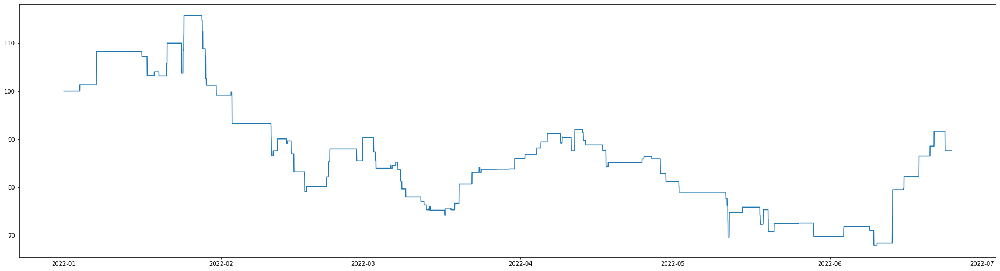

In [18]:
if reinvest_profit_flag == True:
    fig, ax = plt.subplots(figsize=(30, 8))
    ax.plot(budget_dict['time'], budget_dict['budget'])
else:
    print("Not reinvest profit")

In [19]:
if reinvest_profit_flag == True:
    print(f"Max drawdown: {round(max_drawdown * 100, 2)}%")

Max drawdown: 10.6%


In [20]:
win_rate = len(transaction_df[transaction_df['profit'] > 0]) / len(transaction_df)
print(f"Win rate: {round(win_rate * 100, 2)}%")

Win rate: 42.29%


In [21]:
for symbol in transaction_df['symbol'].unique():
    symbol_df = transaction_df[transaction_df['symbol'] == symbol]
    win_rate = len(symbol_df[symbol_df['profit'] > 0]) / len(symbol_df)
    print(f"{symbol} win rate: {round(win_rate * 100, 2)}%")

ETH-PERP win rate: 37.7%
SOL-PERP win rate: 53.06%
BTC-PERP win rate: 38.46%


In [22]:
print(f"Distribution")
print(pd.DataFrame(transaction_df['profit_percent'].describe()))

Distribution
       profit_percent
count      175.000000
mean        -0.437392
std          3.325269
min         -8.915438
25%         -2.503785
50%         -1.287198
75%          1.483439
max          8.742758


In [23]:
for symbol in transaction_df['symbol'].unique():
    temp_return = transaction_df[transaction_df['symbol'] == symbol]['profit_percent']
    
    print(f"Distribution {symbol}:")
    print(pd.DataFrame(temp_return.describe()))
    print("\n")

Distribution ETH-PERP:
       profit_percent
count       61.000000
mean        -0.432013
std          3.067582
min         -5.466068
25%         -2.517342
50%         -1.383329
75%          1.476472
max          8.286675


Distribution SOL-PERP:
       profit_percent
count       49.000000
mean        -0.021944
std          4.187915
min         -8.335690
25%         -3.860978
50%          0.377852
75%          2.558481
max          8.742758


Distribution BTC-PERP:
       profit_percent
count       65.000000
mean        -0.755625
std          2.802036
min         -8.915438
25%         -2.262861
50%         -1.456951
75%          0.988318
max          5.737571




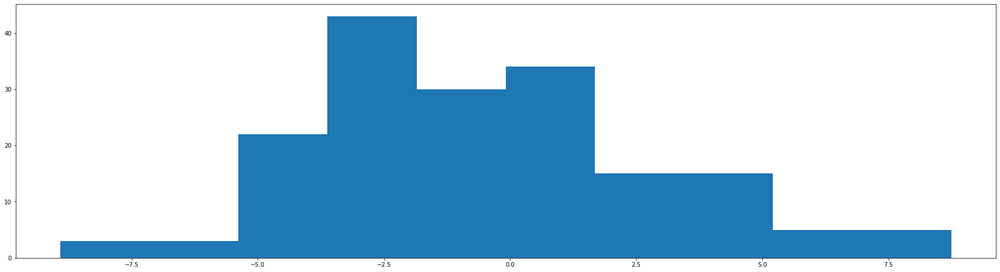

In [24]:
fig, ax = plt.subplots(figsize=(30, 8))
_ = ax.hist(transaction_df['profit_percent'], bins=10)